
0: 384x640 16 soldering_jointss, 93.8ms
Speed: 15.6ms preprocess, 93.8ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
1/1 [==============================] - 7s 7s/step

0: 384x640 16 soldering_jointss, 62.1ms
Speed: 0.0ms preprocess, 62.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
1/1 [==============================] - 0s 47ms/step

0: 384x640 16 soldering_jointss, 47.0ms
Speed: 0.0ms preprocess, 47.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
1/1 [==============================] - 0s 47ms/step

0: 384x640 16 soldering_jointss, 30.7ms
Speed: 0.0ms preprocess, 30.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
1/1 [==============================] - 0s 62ms/step

0: 384x640 16 soldering_jointss, 47.3ms
Speed: 1.0ms preprocess, 47.3ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
1/1 [==============================] - 0s 62ms/step

0: 384x640 16 soldering_jointss, 46.9ms
Speed: 0.0

C:\Users\Brea-RD\AppData\Local\Temp/ipykernel_38496/330645731.py:39: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f,ax = plt.subplots(1,figsize=(12,6))


1/1 [==============================] - 0s 51ms/step

0: 384x640 15 soldering_jointss, 46.3ms
Speed: 1.7ms preprocess, 46.3ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
1/1 [==============================] - 0s 62ms/step


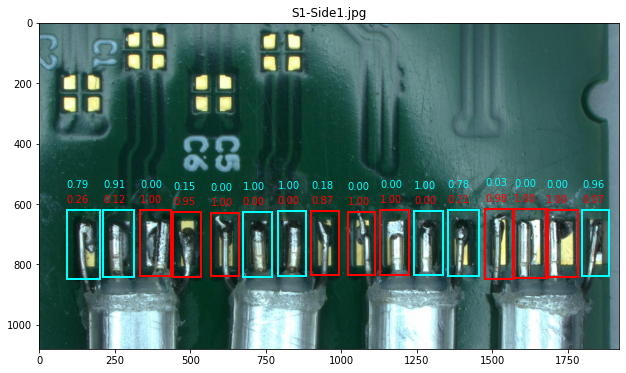

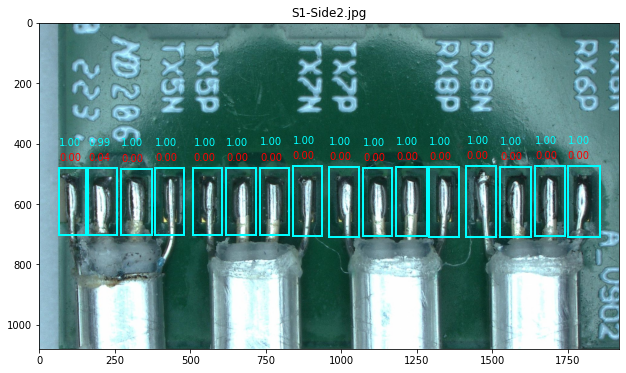

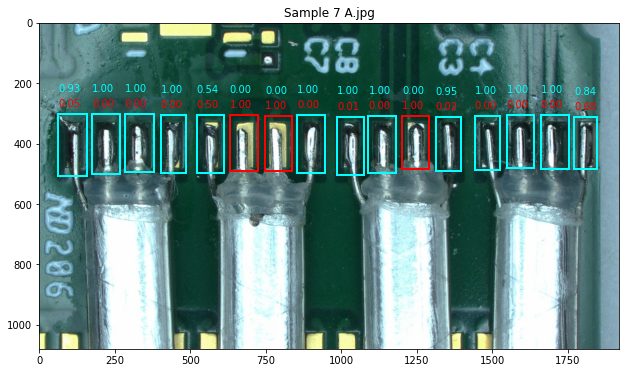

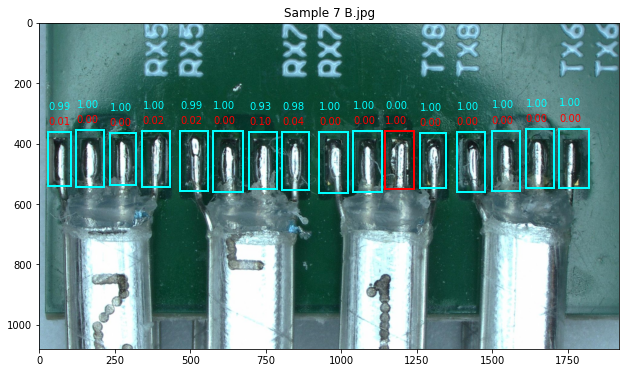

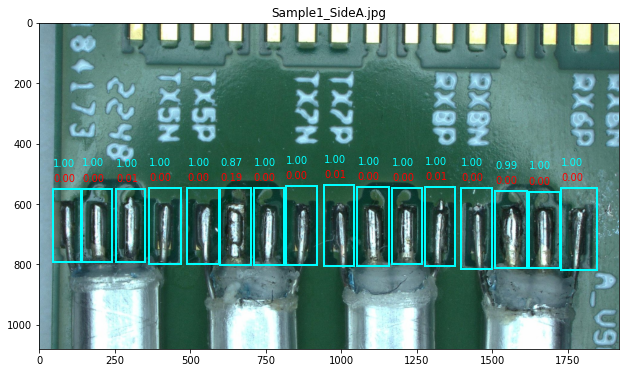

...

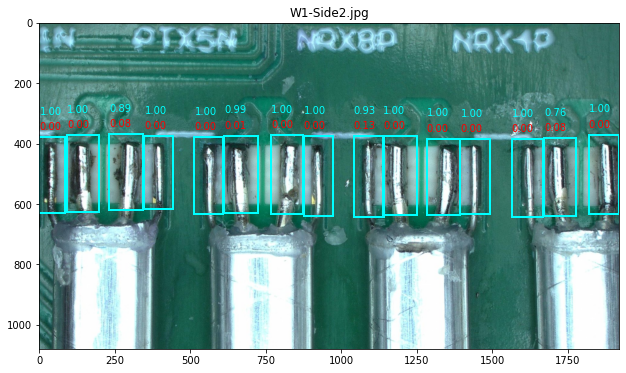

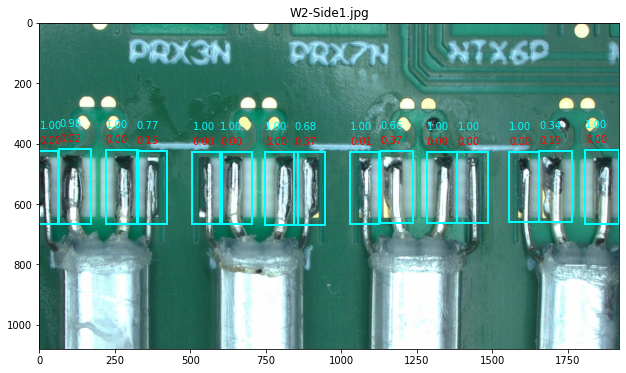

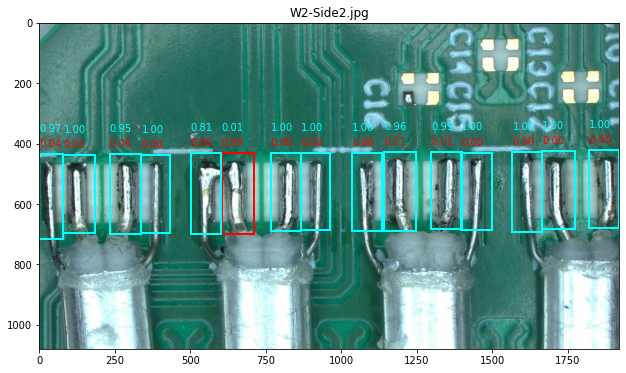

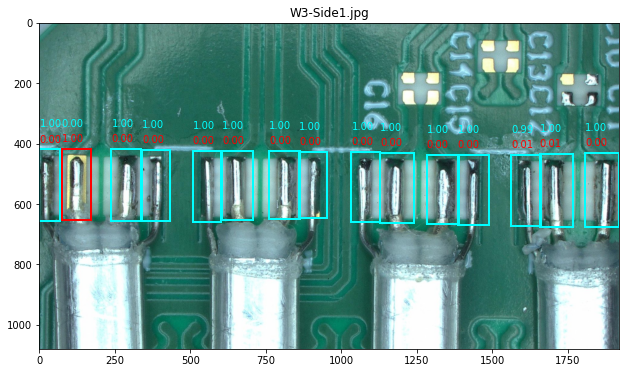

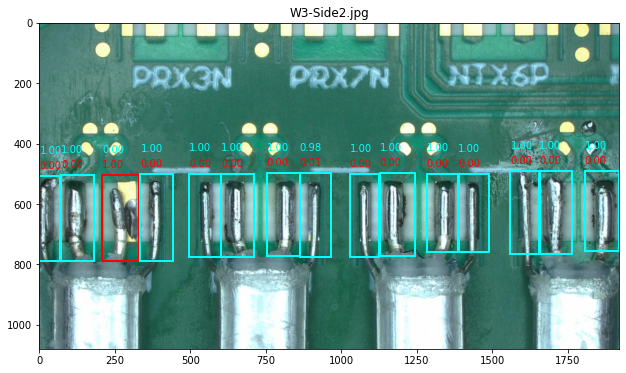

In [1]:
from ultralytics import YOLO
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Rectangle
from tensorflow.keras.models import *

# defind helper functions
def crop_image(image, center_x, center_y, w, h):
    img_width, img_height = image.size
    crop_w = w #* img_width
    crop_h = h #* img_height
    
    # Calculate the bounding box coordinates
    left = center_x  - crop_w / 2
    top = center_y  - crop_h / 2
    right = left + crop_w
    bottom = top + crop_h
    
    # Ensure the coordinates are within the image bounds
    left = max(0, left)
    top = max(0, top)
    right = min(img_width, right)
    bottom = min(img_height, bottom)
    # Crop the image
    return image.crop((left, top, right, bottom))

# Load a model
model = YOLO("best_07312024_2.pt")  # pretrained YOLOv8n model
vgg_model = load_model('model_signal_07312024_2.hdf5')    # pretrained vgg model

# Iterate through all image files in the folder
file_names = os.listdir('./Soldering Joint Samples/')
for file_name in file_names:
    results = model([f"./Soldering Joint Samples/{file_name}"])  # return a list of Results objects
    #Usually this result object only has one component. I think this is for one class in the Yolo model.
    for result in results:
        f,ax = plt.subplots(1,figsize=(12,6))
        ax.imshow(result.orig_img[:,:,::-1])
        ax.set_title(file_name)
        cropped_img_stack = np.zeros([result.boxes.xywh.shape[0],224,224,3],dtype = 'float32') # Initialize a array to store the cropped images.
        itr = 0
        # Write the cropped images into the image stack.
        for box in result.boxes.xywh:
            cropped_img = crop_image(Image.fromarray(np.uint8(result.orig_img)), box.numpy()[0], box.numpy()[1], box.numpy()[2], box.numpy()[3])
            cropped_img = np.asarray(cropped_img.resize((224,224)))
            cropped_img_stack[itr,:,:,:] = cropped_img
            itr += 1
        # Feed the image stack to the vgg model to get the predictions.
        predictions = vgg_model.predict(cropped_img_stack[:,:,:,::-1])
        itr = 0
        # Draw boxes with colors accroding to the vgg model prediction.
        for box in result.boxes.xywh:
            drawBoxCenter = box.numpy()[0:2] - box.numpy()[2:4]/2
            drawBoxW = box.numpy()[2]
            drawBoxH = box.numpy()[3]
            if np.argmax(predictions[itr,:])==0:
                ax.add_patch(Rectangle(drawBoxCenter, drawBoxW, drawBoxH, fill=False, linewidth = 2, color = 'cyan'))
            elif np.argmax(predictions[itr,:])==1:
                ax.add_patch(Rectangle(drawBoxCenter, drawBoxW, drawBoxH, fill=False, linewidth = 2, color = 'r'))
            ax.text(drawBoxCenter[0] , drawBoxCenter[1] - 75, '{:.2f}'.format(predictions[itr,0]), color = 'cyan' )
            ax.text(drawBoxCenter[0] , drawBoxCenter[1] - 25, '{:.2f}'.format(predictions[itr,1]), color = 'r' )
            itr += 1
                

In [6]:
print('{:.2f}'.format(predictions[1,1]))

0.00
